In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import torch
import imageio.v2 as imageio
from mpl_toolkits.mplot3d import Axes3D
import glob
import time

In [2]:
def plot_obj_3d_save(points, index, x_min, x_max, y_min, y_max, z_min, z_max, output_folder):
    points = points.cpu().numpy()
    x = points[:, 0]
    y = points[:, 1]
    z = points[:, 2]

    fig = plt.figure(figsize=(7, 9))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(x, y, z, s=5, color='red', alpha=0.2)

    ax.set_title(f'3D Scatter Plot Frame {index + 1}')
    ax.set_xlabel('X Coordinate', labelpad = 10)
    ax.set_ylabel('Y Coordinate', labelpad = 10)
    ax.set_zlabel('Z Coordinate', labelpad = 50)

    ax.set_xlim([x_min, x_max])
    ax.set_ylim([y_min, y_max])
    ax.set_zlim([z_min, z_max])

    ax.view_init(elev=30, azim=-40)

    plt.savefig(f'{output_folder}/frame_{index:03d}.png')
    plt.close()

def create_video(image_folder, video_path, fps):
    images = [img for img in sorted(os.listdir(image_folder)) if img.endswith(".png")]
    images = sorted(images, key=lambda x: os.path.getctime(os.path.join(image_folder, x)))
    frame = cv2.imread(os.path.join(image_folder, images[0]))
    height, width, layers = frame.shape

    video = cv2.VideoWriter(video_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

    for image in images:
        video.write(cv2.imread(os.path.join(image_folder, image)))

    cv2.destroyAllWindows()
    video.release()

In [3]:
x_min = 0
x_max = 150
y_min = 0
y_max = 130
z_min = 70
z_max = 180

In [4]:
# Set the directories
source_dir = './dhb_frames/sequence_0_cd_only'
output_dir = './dhb_inter/sequence_0_cd_only'
output_frames_dir = os.path.join(output_dir, 'frames_3d')
os.makedirs(output_frames_dir, exist_ok=True)

# Load and plot each .pt file
files = [f for f in os.listdir(source_dir) if f.endswith('.pt')]
files.sort(key=lambda x: os.path.getmtime(os.path.join(source_dir, x)))
for i, file in enumerate(files):
    data = torch.load(os.path.join(source_dir, file))
    # Assuming the data is already in the correct shape and you know the bounds
    plot_obj_3d_save(data, i, x_min, x_max, y_min, y_max, z_min, z_max, output_frames_dir)

In [5]:
# Create a video from the frames
create_video(output_frames_dir, os.path.join(output_dir, 'sequence_0_cd_only.mp4'), fps=20)

### Point Cloud + Interpolation Frames

In [6]:
# Change here for different dataset
main_data = torch.load('./data/DHB-dataset/sequence_0_fps1024_aligned.pt')

n = len(main_data) -3
data = main_data[:n]

last_frame = main_data[n]

In [7]:
x_min = 0
x_max = 150
y_min = 0
y_max = 130
z_min = 70
z_max = 180

In [8]:
def plot_obj_3d_save_new(points, index, x_min, x_max, y_min, y_max, z_min, z_max, col, output_folder, name):
    points = points.cpu().numpy()
    x = points[:, 0]
    y = points[:, 1]
    z = points[:, 2]

    fig = plt.figure(figsize=(7, 9))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(x, y, z, s=5, color=col, alpha=0.2)

    ax.set_title(f'3D Scatter Plot Frame {index + 1}')
    ax.set_xlabel('X Coordinate', labelpad = 10)
    ax.set_ylabel('Y Coordinate', labelpad = 10)
    ax.set_zlabel('Z Coordinate', labelpad = 50)

    ax.set_xlim([x_min, x_max])
    ax.set_ylim([y_min, y_max])
    ax.set_zlim([z_min, z_max])

    ax.view_init(elev=30, azim=-40)

    plt.savefig(f'{output_folder}/{name}_{index:03d}.png')
    plt.close()

def create_video_new(image_folder, video_path, fps):
    images = [img for img in sorted(os.listdir(image_folder)) if img.endswith(".png")]
    images = sorted(images, key=lambda x: os.path.getctime(os.path.join(image_folder, x)))
    frame = cv2.imread(os.path.join(image_folder, images[0]))
    height, width, layers = frame.shape

    video = cv2.VideoWriter(video_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

    for image in images:
        video.write(cv2.imread(os.path.join(image_folder, image)))

    cv2.destroyAllWindows()
    video.release()

In [9]:
source_dir = './dhb_frames/sequence_0_smoothness_test'
output_dir = './dhb_overlap/sequence_0_smoothness_test'
output_frames_dir = os.path.join(output_dir, 'frames_3d')
os.makedirs(output_frames_dir, exist_ok=True)

for i in range(n):
    data_frame = main_data[i]
    plot_obj_3d_save_new(data_frame, i, x_min, x_max, y_min, y_max, z_min, z_max, 'blue', output_frames_dir, 'frame')

    files = sorted(glob.glob(f"{source_dir}/sample_{i}_*"))

    count = 0
    for file in files:
        inter_frame = torch.load(file)
        plot_obj_3d_save_new(inter_frame, i, x_min, x_max, y_min, y_max, z_min, z_max, 'red', output_frames_dir, f'inter_frame_{count}_')
        count += 1

plot_obj_3d_save_new(last_frame, n, x_min, x_max, y_min, y_max, z_min, z_max, 'blue', output_frames_dir, 'frame')

In [10]:
create_video_new(output_frames_dir, os.path.join(output_dir, 'sequence_0_noise2_video_overlap.mp4'), fps=20)

### Ground Truth vs Interpolation

In [11]:
test_file = glob.glob(f"{source_dir}/sample_{70}_*")[3]
test_frame = torch.load(test_file).cpu()
gt_data = main_data[70]

In [12]:
gt_data.shape

torch.Size([1024, 3])

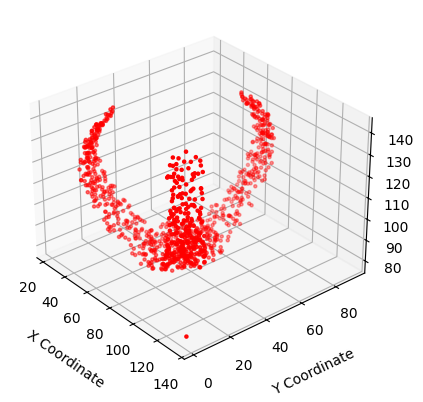

In [13]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Create the 3D scatter plot
ax.scatter(test_frame[:, 0], test_frame[:, 1], test_frame[:, 2], c='r', s = 5)

ax.view_init(elev=30, azim=-40)

# Label axes
ax.set_xlabel('X Coordinate', labelpad = 10)
ax.set_ylabel('Y Coordinate', labelpad = 10)
ax.set_zlabel('Z Coordinate', labelpad = 50)

# Show the plot
plt.show()

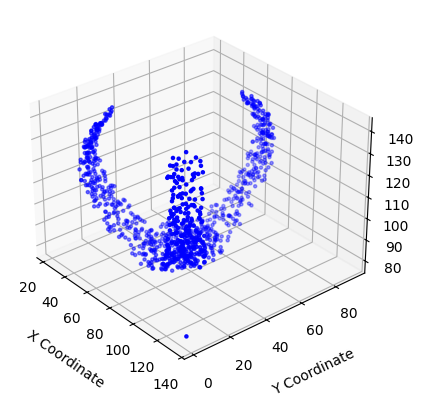

In [14]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Create the 3D scatter plot
ax.scatter(gt_data[:, 0], gt_data[:, 1], gt_data[:, 2], color='blue', s=5)

ax.view_init(elev=30, azim=-40)

# Label axes
ax.set_xlabel('X Coordinate', labelpad = 10)
ax.set_ylabel('Y Coordinate', labelpad = 10)
ax.set_zlabel('Z Coordinate', labelpad = 50)

# Show the plot
plt.show()

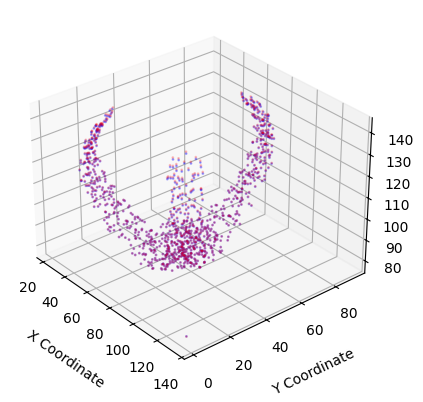

In [15]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Create the 3D scatter plot
ax.scatter(gt_data[:, 0], gt_data[:, 1], gt_data[:, 2], color='blue', s = 1, alpha = 0.3)
ax.scatter(test_frame[:, 0], test_frame[:, 1], test_frame[:, 2], c='red', s = 1, alpha = 0.2)

ax.view_init(elev=30, azim=-40)

# Label axes
ax.set_xlabel('X Coordinate', labelpad = 10)
ax.set_ylabel('Y Coordinate', labelpad = 10)
ax.set_zlabel('Z Coordinate', labelpad = 50)


plt.savefig(os.path.join(output_dir, 'sequence_0_smoothness_test.png'))

# Show the plot
plt.show()

In [16]:
import math
import plotly.graph_objects as go

# Example data:
# gt_data = your ground truth data of shape [n, 3]
# test_frame = your test frame data of shape [n, 3]

# Create a 3D scatter plot for both datasets
fig = go.Figure()

# Ground truth data (blue, opacity 0.3, marker size 1)
fig.add_trace(go.Scatter3d(
    x=gt_data[:, 0],
    y=gt_data[:, 1],
    z=gt_data[:, 2],
    mode='markers',
    marker=dict(
        size=3,
        color='black',
        opacity=0.3
    ),
    name='GT Data'
))

# Test frame data (red, opacity 0.2, marker size 1)
fig.add_trace(go.Scatter3d(
    x=test_frame[:, 0],
    y=test_frame[:, 1],
    z=test_frame[:, 2],
    mode='markers',
    marker=dict(
        size=3,
        color='red',
        opacity=0.2
    ),
    name='Test Frame'
))

# Convert matplotlib's view_init(elev=30, azim=-40) to a camera position.
# Compute eye coordinates using spherical coordinates.
elev = math.radians(30)
azim = math.radians(-40)
r = 2  # distance from the center; adjust as needed
eye_x = r * math.cos(elev) * math.cos(azim)
eye_y = r * math.cos(elev) * math.sin(azim)
eye_z = r * math.sin(elev)

# Update the layout to set axis titles and the camera view
fig.update_layout(
    scene=dict(
        xaxis_title='X Coordinate',
        yaxis_title='Y Coordinate',
        zaxis_title='Z Coordinate',
        camera=dict(
            eye=dict(x=eye_x, y=eye_y, z=eye_z)
        )
    )
)

fig.show()


### Remove Noise from Data

In [15]:
# from sklearn.neighbors import NearestNeighbors

In [16]:
from pytorch3d.loss import chamfer_distance
from utils.smooth_loss import compute_smooth
from utils.utils import *
sys.path.append('./utils/EMD')
sys.path.append('./utils/CD')
from emd import earth_mover_distance
import chamfer3D.dist_chamfer_3D

Loaded compiled 3D CUDA chamfer distance


In [17]:
# def sor_filter(points, k=10, z_thresh=1.0):
#     """
#     Statistical Outlier Removal (SOR) filter.
#     - points: (N,3) array of XYZ coordinates.
#     - k: number of neighbors to consider.
#     - z_thresh: threshold multiplier for mean + z_thresh * std.
#     """
#     nbrs = NearestNeighbors(n_neighbors=k+1).fit(points)
#     distances, _ = nbrs.kneighbors(points)
#     mean_dist = distances[:, 1:].mean(axis=1)
#     mu, sigma = mean_dist.mean(), mean_dist.std()
#     threshold = mu + z_thresh * sigma
#     mask = mean_dist <= threshold
#     return points[mask]

# #k — how many neighbors to consider (e.g. try 20 or 30)
# #z_thresh — how strict the outlier cutoff is (e.g. 0.5 to 2.0)

In [18]:
# np.random.seed(42)
# test_frame_2 = sor_filter(test_frame, k=5, z_thresh=2.0).clone().detach()

In [19]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# # Create the 3D scatter plot
# ax.scatter(gt_data[:, 0], gt_data[:, 1], gt_data[:, 2], color='blue', s = 1, alpha = 0.3)
# ax.scatter(test_frame_2[:, 0], test_frame_2[:, 1], test_frame_2[:, 2], c='red', s = 1, alpha = 0.2)

# ax.view_init(elev=30, azim=-40)

# # Label axes
# ax.set_xlabel('X Coordinate', labelpad = 10)
# ax.set_ylabel('Y Coordinate', labelpad = 10)
# ax.set_zlabel('Z Coordinate', labelpad = 50)


# plt.savefig(os.path.join(output_dir, 'sequence_0_noise2_video_overlap.png'))

# # Show the plot
# plt.show()

In [20]:
print("CD Error:",chamfer_distance(gt_data.unsqueeze(0).float(), test_frame.unsqueeze(0).float())[0].item())

device = torch.device("cuda")
gt = gt_data.unsqueeze(0).float().to(device)
pred = test_frame.unsqueeze(0).float().to(device)
dist = earth_mover_distance(gt, pred, transpose=False)
emd_error = (dist / test_frame.shape[0]).mean().item()
print("EMD Error:", emd_error)

CD Error: 1.4304231405258179
EMD Error: 8.69771671295166


In [44]:
## Gausian Smoothing

import numpy as np
import torch
import pandas as pd
from pytorch3d.loss import chamfer_distance
from emd import earth_mover_distance
import chamfer3D.dist_chamfer_3D
from sklearn.neighbors import NearestNeighbors

# --- 1) Gaussian smoother ---
def gaussian_smooth_np(points: np.ndarray, k: int = 20, sigma: float = 1.0) -> np.ndarray:
    """
    Gaussian neighbor smoothing for point clouds.
    - points: (N,3) numpy array
    - k: number of neighbors
    - sigma: Gaussian spatial scale
    Returns a new (N,3) array of smoothed points.
    """
    pts = points.copy()
    nbrs = NearestNeighbors(n_neighbors=k).fit(pts)
    distances, indices = nbrs.kneighbors(pts)
    
    smoothed = np.zeros_like(pts)
    for i in range(pts.shape[0]):
        neigh_pts = pts[indices[i]]
        dists = distances[i][:, np.newaxis]
        weights = np.exp(-(dists**2) / (2 * sigma**2))
        smoothed[i] = (weights * neigh_pts).sum(axis=0) / weights.sum()
    return smoothed

# --- 2) Error computation (unchanged) ---
def compute_errors(gt_np: np.ndarray, pred_np: np.ndarray, device: str = "cuda"):
    gt   = torch.from_numpy(gt_np).unsqueeze(0).float().to(device)
    pred = torch.from_numpy(pred_np).unsqueeze(0).float().to(device)

    cd_val, _ = chamfer_distance(gt, pred)
    emd_val   = earth_mover_distance(gt, pred, transpose=False)
    emd_norm  = (emd_val / pred_np.shape[0]).mean().item()
    return cd_val.item(), emd_norm

# --- 3) Grid‐search over Gaussian’s (k, sigma) ---
def tune_gaussian_hyperparams(
    gt_data: np.ndarray,
    raw_pred_data: np.ndarray,
    k_values: list[int],
    sigma_values: list[float],
    device: str = "cuda"
) -> pd.DataFrame:
    """
    Grid-search over Gaussian smoothing parameters.
    Returns DataFrame sorted by composite rank of Chamfer+EMD.
    """
    records = []
    for k in k_values:
        for sigma in sigma_values:
            smoothed = gaussian_smooth_np(raw_pred_data, k=k, sigma=sigma)
            cd_err, emd_err = compute_errors(gt_data, smoothed, device=device)
            records.append({
                "k": k,
                "sigma": sigma,
                "Chamfer": cd_err,
                "EMD": emd_err,
                "n_pts_after": smoothed.shape[0]  # should match original N
            })

    df = pd.DataFrame(records)
    df["rank_cd"]        = df["Chamfer"].rank()
    df["rank_emd"]       = df["EMD"].rank()
    df["composite_rank"] = df["rank_cd"] + df["rank_emd"]
    return df.sort_values("composite_rank").reset_index(drop=True)

# --- 4) Example usage with adaptive sigma grid ---
gt_np  = gt_data.detach().cpu().numpy()
raw_np = test_frame.detach().cpu().numpy()
k_vals = [2, 3, 4, 5, 10, 20, 30, 40, 50]

# Estimate average 1-NN distance to set sigma range
nn2 = NearestNeighbors(n_neighbors=2).fit(raw_np)
dists2, _ = nn2.kneighbors(raw_np)
avg_nn = dists2[:, 1].mean()
sigma_vals = [0.5 * avg_nn, avg_nn, 2 * avg_nn]

print(f"Average 1-NN distance: {avg_nn:.4f}")
print(f"Testing sigma values: {sigma_vals}")

results = tune_gaussian_hyperparams(gt_np, raw_np, k_vals, sigma_vals, device="cuda")
print(results)

Average 1-NN distance: 1.8186
Testing sigma values: [0.9093220931229331, 1.8186441862458662, 3.6372883724917324]
     k     sigma   Chamfer         EMD  n_pts_after  rank_cd  rank_emd  \
0    3  0.909322  1.476339    7.211612         1024      2.0       1.0   
1    2  0.909322  1.471342   11.292916         1024      1.0       9.0   
2   50  0.909322  1.482789   10.697877         1024      3.5       7.0   
3   40  0.909322  1.482789   10.697877         1024      3.5       7.0   
4   10  0.909322  1.483096   10.666454         1024      7.0       4.0   
5   20  0.909322  1.482790   10.697863         1024      6.0       5.0   
6    4  0.909322  1.483454    9.544926         1024      8.0       3.0   
7    5  0.909322  1.484797    8.818108         1024      9.0       2.0   
8   30  0.909322  1.482789   10.697877         1024      5.0       7.0   
9    2  1.818644  1.805685   12.115321         1024     10.0      10.0   
10   3  1.818644  1.950727   18.970745         1024     11.0      12.0   

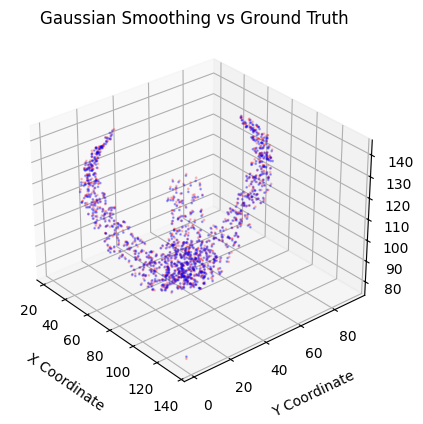

In [45]:
np.random.seed(42)

test_frame_2 = gaussian_smooth_np(test_frame.detach().cpu().numpy(), k=2, sigma=0.889760847701894)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.set_title("Gaussian Smoothing vs Ground Truth")

# Create the 3D scatter plot
ax.scatter(gt_data[:, 0], gt_data[:, 1], gt_data[:, 2], color='blue', s = 1, alpha = 0.3)
ax.scatter(test_frame_2[:, 0], test_frame_2[:, 1], test_frame_2[:, 2], c='red', s = 1, alpha = 0.2)

ax.view_init(elev=30, azim=-40)

# Label axes
ax.set_xlabel('X Coordinate', labelpad = 10)
ax.set_ylabel('Y Coordinate', labelpad = 10)
ax.set_zlabel('Z Coordinate', labelpad = 50)

# Show the plot
plt.show()

In [42]:
## Laplacian Smoothing

import numpy as np
import torch
import pandas as pd
from pytorch3d.loss import chamfer_distance
from emd import earth_mover_distance
import chamfer3D.dist_chamfer_3D
from sklearn.neighbors import NearestNeighbors

# --- 1) Laplacian smoother ---
def laplacian_smooth_np(points: np.ndarray, k: int = 10, lambd: float = 0.5, iterations: int = 1) -> np.ndarray:
    """
    Laplacian smoothing for point clouds.
    - points: (N,3) numpy array
    - k: number of neighbors to use (excluding self)
    - lambd: smoothing factor (0 < lambd < 1)
    - iterations: number of smoothing passes
    Returns a new (N,3) array of smoothed points.
    """
    pts = points.copy()
    for _ in range(iterations):
        nbrs = NearestNeighbors(n_neighbors=k+1).fit(pts)
        _, indices = nbrs.kneighbors(pts)
        smoothed = pts.copy()
        for i, neigh_idx in enumerate(indices):
            neighbors = neigh_idx[1:]  # skip self
            neighbor_mean = pts[neighbors].mean(axis=0)
            smoothed[i] = pts[i] + lambd * (neighbor_mean - pts[i])
        pts = smoothed
    return pts

# --- 2) Error computation (unchanged) ---
def compute_errors(gt_np: np.ndarray, pred_np: np.ndarray, device: str = "cuda"):
    gt   = torch.from_numpy(gt_np).unsqueeze(0).float().to(device)
    pred = torch.from_numpy(pred_np).unsqueeze(0).float().to(device)
    cd_val, _ = chamfer_distance(gt, pred)
    emd_val   = earth_mover_distance(gt, pred, transpose=False)
    emd_norm  = (emd_val / pred_np.shape[0]).mean().item()
    return cd_val.item(), emd_norm

# --- 3) Grid-search over Laplacian’s (k, lambda) ---
def tune_laplacian_hyperparams(
    gt_data: np.ndarray,
    raw_pred_data: np.ndarray,
    k_values: list[int],
    lambd_values: list[float],
    iterations: int = 3,
    device: str = "cuda"
) -> pd.DataFrame:
    """
    Grid-search over Laplacian smoothing parameters.
    Returns DataFrame sorted by composite rank of Chamfer+EMD.
    """
    records = []
    for k in k_values:
        for lambd in lambd_values:
            smoothed = laplacian_smooth_np(raw_pred_data, k=k, lambd=lambd, iterations=iterations)
            cd_err, emd_err = compute_errors(gt_data, smoothed, device=device)
            records.append({
                "k": k,
                "lambda": lambd,
                "iterations": iterations,
                "Chamfer": cd_err,
                "EMD": emd_err,
                "n_pts_after": smoothed.shape[0]
            })

    df = pd.DataFrame(records)
    df["rank_cd"]        = df["Chamfer"].rank()
    df["rank_emd"]       = df["EMD"].rank()
    df["composite_rank"] = df["rank_cd"] + df["rank_emd"]
    return df.sort_values("composite_rank").reset_index(drop=True)

# --- 4) Example usage ---
gt_np    = gt_data.detach().cpu().numpy()
raw_np   = test_frame.detach().cpu().numpy()
k_vals   = [2, 3, 4, 5, 10, 20, 30, 40, 50]
lambda_vals = [0.1, 0.3, 0.5, 0.7, 0.9]
iterations = 3

results = tune_laplacian_hyperparams(gt_np, raw_np, k_vals, lambda_vals, iterations=iterations, device="cuda")
print(results)


     k  lambda  iterations    Chamfer         EMD  n_pts_after  rank_cd  \
0    5     0.1           3   1.906016   23.240870         1024      3.0   
1    4     0.1           3   1.898253   24.088818         1024      2.0   
2    3     0.1           3   1.878826   25.522022         1024      1.0   
3   10     0.1           3   1.955262   23.482981         1024      5.0   
4   20     0.1           3   2.170154   25.045010         1024      6.0   
5    2     0.1           3   1.910022   28.378323         1024      4.0   
6   30     0.1           3   2.399618   27.332382         1024      7.0   
7   40     0.1           3   2.636879   34.702377         1024      8.0   
8    4     0.3           3   4.201158   45.614639         1024     12.0   
9    3     0.3           3   4.010947   47.172867         1024     11.0   
10  50     0.1           3   2.892181   52.651485         1024      9.0   
11   2     0.3           3   3.852406   52.794876         1024     10.0   
12   5     0.3           

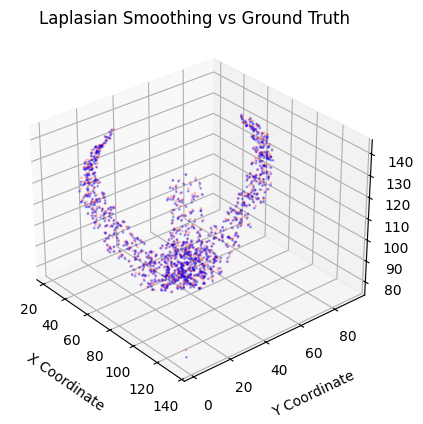

In [24]:
np.random.seed(42)

test_frame_2 = laplacian_smooth_np(test_frame.detach().cpu().numpy(), k=10, lambd = 0.1)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.set_title("Laplasian Smoothing vs Ground Truth")

# Create the 3D scatter plot
ax.scatter(gt_data[:, 0], gt_data[:, 1], gt_data[:, 2], color='blue', s = 1, alpha = 0.3)
ax.scatter(test_frame_2[:, 0], test_frame_2[:, 1], test_frame_2[:, 2], c='red', s = 1, alpha = 0.2)

ax.view_init(elev=30, azim=-40)

# Label axes
ax.set_xlabel('X Coordinate', labelpad = 10)
ax.set_ylabel('Y Coordinate', labelpad = 10)
ax.set_zlabel('Z Coordinate', labelpad = 50)

# Show the plot
plt.show()

In [40]:
## LOESS-Style Smoothing

import numpy as np
import torch
import pandas as pd
from pytorch3d.loss import chamfer_distance
from emd import earth_mover_distance
import chamfer3D.dist_chamfer_3D
from sklearn.neighbors import NearestNeighbors

# --- 1) LOESS (Tricube) smoother ---
def loess_smooth_np(points: np.ndarray, k: int = 20) -> np.ndarray:
    """
    LOESS-style smoothing for point clouds using the tricube kernel.
    - points: (N,3) numpy array
    - k: number of nearest neighbors to include
    Returns a new (N,3) array of smoothed points (same shape).
    """
    pts = points.copy()
    nbrs = NearestNeighbors(n_neighbors=k).fit(pts)
    distances, indices = nbrs.kneighbors(pts)
    
    smoothed = np.zeros_like(pts)
    for i in range(pts.shape[0]):
        neigh_pts = pts[indices[i]]              # shape (k,3)
        d = distances[i]                          # shape (k,)
        # normalize distances by the max distance (span)
        r = d[-1] if d[-1] > 0 else 1.0
        u = d / r
        # tricube weights: (1 - |u|^3)^3 for |u|<=1, zero beyond
        w = (1 - u**3)**3
        w_sum = w.sum()
        if w_sum > 0:
            smoothed[i] = (w[:, None] * neigh_pts).sum(axis=0) / w_sum
        else:
            smoothed[i] = pts[i]
    return smoothed

# --- 2) Error computation ---
def compute_errors(gt_np: np.ndarray, pred_np: np.ndarray, device: str = "cuda"):
    gt   = torch.from_numpy(gt_np).unsqueeze(0).float().to(device)
    pred = torch.from_numpy(pred_np).unsqueeze(0).float().to(device)

    cd_val, _ = chamfer_distance(gt, pred)
    emd_val   = earth_mover_distance(gt, pred, transpose=False)
    emd_norm  = (emd_val / pred_np.shape[0]).mean().item()
    return cd_val.item(), emd_norm

# --- 3) Hyperparameter tuning over k ---
def tune_loess_hyperparams(
    gt_data: np.ndarray,
    raw_pred_data: np.ndarray,
    k_values: list[int],
    device: str = "cuda"
) -> pd.DataFrame:
    """
    Grid-search over LOESS neighborhood size k.
    Returns DataFrame sorted by composite Chamfer+EMD rank.
    """
    records = []
    for k in k_values:
        smoothed = loess_smooth_np(raw_pred_data, k=k)
        cd_err, emd_err = compute_errors(gt_data, smoothed, device=device)
        records.append({
            "k": k,
            "Chamfer": cd_err,
            "EMD": emd_err,
            "n_pts_after": smoothed.shape[0]
        })
    df = pd.DataFrame(records)
    df["rank_cd"]        = df["Chamfer"].rank()
    df["rank_emd"]       = df["EMD"].rank()
    df["composite_rank"] = df["rank_cd"] + df["rank_emd"]
    return df.sort_values("composite_rank").reset_index(drop=True)

# --- 4) Example usage ---
gt_np  = gt_data.detach().cpu().numpy()
raw_np = test_frame.detach().cpu().numpy()
k_vals = [2,3,4,5,10, 20, 30, 40, 50]

results = tune_loess_hyperparams(gt_np, raw_np, k_vals, device="cuda")
print(results)


    k   Chamfer         EMD  n_pts_after  rank_cd  rank_emd  composite_rank
0   2  1.430423    8.697717         1024      1.0       2.0             3.0
1   3  1.534406    8.393206         1024      2.0       1.0             3.0
2   4  1.684642   10.259802         1024      3.0       3.0             6.0
3   5  1.832226   10.373058         1024      4.0       4.0             8.0
4  10  2.497272   20.589005         1024      5.0       5.0            10.0
5  20  3.619467   53.355743         1024      6.0       6.0            12.0
6  30  4.710853   98.770912         1024      7.0       7.0            14.0
7  40  5.899996  135.962112         1024      8.0       8.0            16.0
8  50  7.015326  193.765854         1024      9.0       9.0            18.0


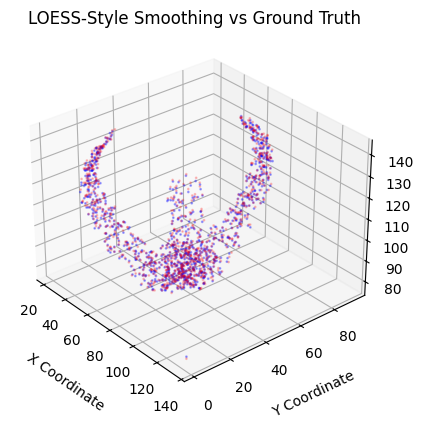

In [41]:
np.random.seed(42)

test_frame_2 = loess_smooth_np(test_frame.detach().cpu().numpy(), k=2)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.set_title("LOESS-Style Smoothing vs Ground Truth")

# Create the 3D scatter plot
ax.scatter(gt_data[:, 0], gt_data[:, 1], gt_data[:, 2], color='blue', s = 1, alpha = 0.3)
ax.scatter(test_frame_2[:, 0], test_frame_2[:, 1], test_frame_2[:, 2], c='red', s = 1, alpha = 0.2)

ax.view_init(elev=30, azim=-40)

# Label axes
ax.set_xlabel('X Coordinate', labelpad = 10)
ax.set_ylabel('Y Coordinate', labelpad = 10)
ax.set_zlabel('Z Coordinate', labelpad = 50)

# Show the plot
plt.show()

In [36]:
## Total Variation (TV) Denoising

import numpy as np
import torch
import pandas as pd
from pytorch3d.loss import chamfer_distance
from emd import earth_mover_distance
import chamfer3D.dist_chamfer_3D
from sklearn.neighbors import NearestNeighbors

# --- 1) TV denoising function ---
def tv_denoise_graph(points: np.ndarray, k: int = 10, lam: float = 1.0, iterations: int = 20) -> np.ndarray:
    """
    Graph-based Total Variation (TV) denoising.
    - points: (N,3) noisy points
    - k: number of neighbors for graph
    - lam: TV weight
    - iterations: algorithm passes
    Returns denoised (N,3) array.
    """
    pts = points.copy()
    N, _ = pts.shape

    # Build edges
    nbrs = NearestNeighbors(n_neighbors=k+1).fit(pts)
    _, indices = nbrs.kneighbors(pts)
    edge_set = set()
    for i in range(N):
        for j in indices[i,1:]:
            edge_set.add(tuple(sorted((i, j))))
    edges = list(edge_set)

    # Initialize variables
    f = pts.copy()
    u = f.copy()
    u_bar = u.copy()
    p = np.zeros((len(edges), 3))

    # Primal-dual parameters
    tau = 0.1
    sigma = 0.1
    theta = 1.0

    for _ in range(iterations):
        # Dual update
        diffs = u_bar[[e[0] for e in edges]] - u_bar[[e[1] for e in edges]]
        p += sigma * diffs
        norms = np.linalg.norm(p, axis=1, keepdims=True)
        p /= np.maximum(1, norms / lam)

        # Primal update
        q = np.zeros_like(u)
        for idx, (i, j) in enumerate(edges):
            q[i] += p[idx]
            q[j] -= p[idx]

        u_old = u.copy()
        u = (u + tau * q + tau * f) / (1 + tau)
        u_bar = u + theta * (u - u_old)

    return u

# --- 2) Error computation (unchanged) ---
def compute_errors(gt_np: np.ndarray, pred_np: np.ndarray, device: str = "cuda"):
    gt   = torch.from_numpy(gt_np).unsqueeze(0).float().to(device)
    pred = torch.from_numpy(pred_np).unsqueeze(0).float().to(device)
    cd_val, _ = chamfer_distance(gt, pred)
    emd_val   = earth_mover_distance(gt, pred, transpose=False)
    emd_norm  = (emd_val / pred_np.shape[0]).mean().item()
    return cd_val.item(), emd_norm

# --- 3) Grid‐search over TV’s (k, lam) ---
def tune_tv_hyperparams(
    gt_data: np.ndarray,
    raw_pred_data: np.ndarray,
    k_values: list[int],
    lam_values: list[float],
    iterations: int = 20,
    device: str = "cuda"
) -> pd.DataFrame:
    """
    Tune TV denoising by sweeping k (neighbors) and lam (TV weight).
    Returns DataFrame sorted by composite Chamfer+EMD rank.
    """
    records = []
    for k in k_values:
        for lam in lam_values:
            denoised = tv_denoise_graph(raw_pred_data, k=k, lam=lam, iterations=iterations)
            cd_err, emd_err = compute_errors(gt_data, denoised, device=device)
            records.append({
                "k": k,
                "lam": lam,
                "iterations": iterations,
                "Chamfer": cd_err,
                "EMD": emd_err,
                "n_pts_after": denoised.shape[0]
            })

    df = pd.DataFrame(records)
    df["rank_cd"]        = df["Chamfer"].rank()
    df["rank_emd"]       = df["EMD"].rank()
    df["composite_rank"] = df["rank_cd"] + df["rank_emd"]
    return df.sort_values("composite_rank").reset_index(drop=True)

# --- 4) Example usage ---
gt_np    = gt_data.detach().cpu().numpy()
raw_np   = test_frame.detach().cpu().numpy()
k_vals   = [1, 2, 3, 4, 5, 10, 20, 30]
lam_vals = [0.1, 0.5, 1.0]
iters    = 30

results = tune_tv_hyperparams(gt_np, raw_np, k_vals, lam_vals, iterations=iters, device="cuda")
print(results)

     k  lam  iterations     Chamfer          EMD  n_pts_after  rank_cd  \
0    1  0.1          30    1.472675     9.595658         1024      1.0   
1    2  0.1          30    1.499546     7.623999         1024      2.0   
2    3  0.1          30    1.533669    11.849550         1024      3.0   
3    5  0.1          30    1.636168    11.119272         1024      5.0   
4    4  0.1          30    1.580448    12.141407         1024      4.0   
5   10  0.1          30    1.993347    14.141412         1024      6.0   
6    1  0.5          30    2.048204    16.219734         1024      7.0   
7    2  0.5          30    2.740348    22.276745         1024      8.0   
8   20  0.1          30    3.237135    28.954378         1024      9.0   
9    3  0.5          30    3.612971    35.450039         1024     10.0   
10   1  1.0          30    3.719537    49.370277         1024     11.0   
11   4  0.5          30    4.708122    54.926922         1024     12.0   
12  30  0.1          30    5.085465   

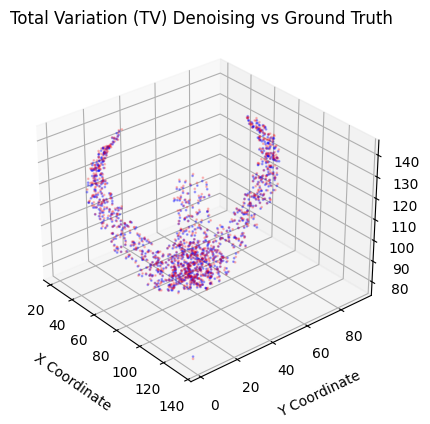

In [37]:
np.random.seed(42)

test_frame_2 = tv_denoise_graph(test_frame.detach().cpu().numpy(), k=1, lam = 0.1, iterations = 30)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.set_title("Total Variation (TV) Denoising vs Ground Truth")

# Create the 3D scatter plot
ax.scatter(gt_data[:, 0], gt_data[:, 1], gt_data[:, 2], color='blue', s = 1, alpha = 0.3)
ax.scatter(test_frame_2[:, 0], test_frame_2[:, 1], test_frame_2[:, 2], c='red', s = 1, alpha = 0.2)

ax.view_init(elev=30, azim=-40)

# Label axes
ax.set_xlabel('X Coordinate', labelpad = 10)
ax.set_ylabel('Y Coordinate', labelpad = 10)
ax.set_zlabel('Z Coordinate', labelpad = 50)

# Show the plot
plt.show()

In [32]:
## Median Filtering

import numpy as np
import torch
import pandas as pd
from pytorch3d.loss import chamfer_distance
from emd import earth_mover_distance
from sklearn.neighbors import NearestNeighbors

# --- Median filtering function ---
def median_filtering(points: np.ndarray, k: int = 10) -> np.ndarray:
    """
    Median filtering for denoising.
    - points: (N,3) noisy points
    - k: number of neighbors
    Returns denoised (N,3) array.
    """
    nbrs = NearestNeighbors(n_neighbors=k+1).fit(points)
    _, indices = nbrs.kneighbors(points)

    denoised_pts = np.zeros_like(points)

    for i, neighbors in enumerate(indices):
        neighbor_pts = points[neighbors[1:]]  # exclude point itself
        denoised_pts[i] = np.median(neighbor_pts, axis=0)

    return denoised_pts

# --- Error computation (unchanged) ---
def compute_errors(gt_np: np.ndarray, pred_np: np.ndarray, device: str = "cuda"):
    gt   = torch.from_numpy(gt_np).unsqueeze(0).float().to(device)
    pred = torch.from_numpy(pred_np).unsqueeze(0).float().to(device)
    cd_val, _ = chamfer_distance(gt, pred)
    emd_val   = earth_mover_distance(gt, pred, transpose=False)
    emd_norm  = (emd_val / pred_np.shape[0]).mean().item()
    return cd_val.item(), emd_norm

# --- Grid‐search over Median filtering's (k) ---
def tune_median_hyperparams(
    gt_data: np.ndarray,
    raw_pred_data: np.ndarray,
    k_values: list[int],
    device: str = "cuda"
) -> pd.DataFrame:
    """
    Tune median filtering by sweeping k (neighbors).
    Returns DataFrame sorted by composite Chamfer+EMD rank.
    """
    records = []
    for k in k_values:
        denoised = median_filtering(raw_pred_data, k=k)
        cd_err, emd_err = compute_errors(gt_data, denoised, device=device)
        records.append({
            "k": k,
            "Chamfer": cd_err,
            "EMD": emd_err,
            "n_pts_after": denoised.shape[0]
        })

    df = pd.DataFrame(records)
    df["rank_cd"]        = df["Chamfer"].rank()
    df["rank_emd"]       = df["EMD"].rank()
    df["composite_rank"] = df["rank_cd"] + df["rank_emd"]
    return df.sort_values("composite_rank").reset_index(drop=True)

# --- Example usage ---
gt_np    = gt_data.detach().cpu().numpy()
raw_np   = test_frame.detach().cpu().numpy()
k_vals   = [1, 2, 3, 5, 10, 15, 20, 30]  # Example neighborhood sizes

results = tune_median_hyperparams(gt_np, raw_np, k_vals, device="cuda")
print(results)

    k    Chamfer         EMD  n_pts_after  rank_cd  rank_emd  composite_rank
0   1   4.607083   62.649441         1024      1.0       1.0             2.0
1   2   5.303396   72.405159         1024      3.0       2.0             5.0
2   3   5.298365   95.659729         1024      2.0       3.0             5.0
3   5   6.011835  117.857773         1024      4.0       4.0             8.0
4  10   7.104260  169.494293         1024      5.0       5.0            10.0
5  15   8.168557  216.208557         1024      6.0       6.0            12.0
6  20   9.407100  275.204041         1024      7.0       7.0            14.0
7  30  11.731627  342.221893         1024      8.0       8.0            16.0


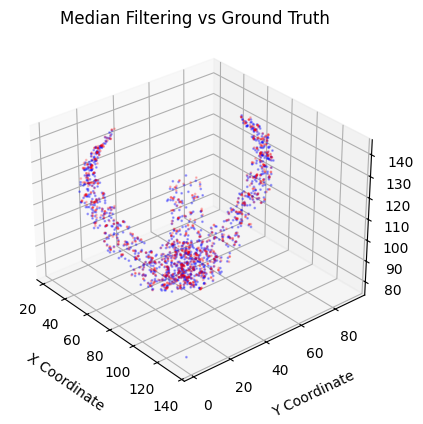

In [35]:
np.random.seed(42)

test_frame_2 = median_filtering(test_frame.detach().cpu().numpy(), k=1)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.set_title("Median Filtering vs Ground Truth")

# Create the 3D scatter plot
ax.scatter(gt_data[:, 0], gt_data[:, 1], gt_data[:, 2], color='blue', s = 1, alpha = 0.3)
ax.scatter(test_frame_2[:, 0], test_frame_2[:, 1], test_frame_2[:, 2], c='red', s = 1, alpha = 0.2)

ax.view_init(elev=30, azim=-40)

# Label axes
ax.set_xlabel('X Coordinate', labelpad = 10)
ax.set_ylabel('Y Coordinate', labelpad = 10)
ax.set_zlabel('Z Coordinate', labelpad = 50)

# Show the plot
plt.show()

In [56]:
fig = go.Figure()

# Ground truth data (blue, opacity 0.3, marker size 1)
fig.add_trace(go.Scatter3d(
    x=gt_data[:, 0],
    y=gt_data[:, 1],
    z=gt_data[:, 2],
    mode='markers',
    marker=dict(
        size=3,
        color='black',
        opacity=0.3
    ),
    name='GT Data'
))

# Test frame data (red, opacity 0.2, marker size 1)
fig.add_trace(go.Scatter3d(
    x=test_frame_2[:, 0],
    y=test_frame_2[:, 1],
    z=test_frame_2[:, 2],
    mode='markers',
    marker=dict(
        size=3,
        color='red',
        opacity=0.2
    ),
    name='Test Frame'
))

# Convert matplotlib's view_init(elev=30, azim=-40) to a camera position.
# Compute eye coordinates using spherical coordinates.
elev = math.radians(30)
azim = math.radians(-40)
r = 2  # distance from the center; adjust as needed
eye_x = r * math.cos(elev) * math.cos(azim)
eye_y = r * math.cos(elev) * math.sin(azim)
eye_z = r * math.sin(elev)

# Update the layout to set axis titles and the camera view
fig.update_layout(
    scene=dict(
        xaxis_title='X Coordinate',
        yaxis_title='Y Coordinate',
        zaxis_title='Z Coordinate',
        camera=dict(
            eye=dict(x=eye_x, y=eye_y, z=eye_z)
        )
    )
)

fig.show()


### Another Noise Method Testing (work later)

In [74]:
def knn_smooth(points, k=10, iterations=2, lambd=0.5):
    """
    KNN-based Laplacian smoothing that GUARANTEES the same shape before & after.
    - points: (N,3) numpy array (or torch Tensor; handled internally).
    - Returns: smoothed points of the same type & shape as input.
    """
    # Handle PyTorch tensors
    is_tensor = False
    try:
        import torch
        if isinstance(points, torch.Tensor):
            is_tensor = True
            device = points.device
            dtype = points.dtype
            pts = points.detach().cpu().numpy()
        else:
            pts = points.copy()
    except ImportError:
        pts = points.copy()

    orig_shape = pts.shape
    smoothed = pts.copy()

    # smoothing passes
    for _ in range(iterations):
        nbrs = NearestNeighbors(n_neighbors=k+1).fit(smoothed)
        _, idx = nbrs.kneighbors(smoothed)
        neighbor_means = np.array([
            smoothed[neighbors[1:]].mean(axis=0)
            for neighbors in idx
        ])
        smoothed += lambd * (neighbor_means - smoothed)

    # ensure shape preserved
    smoothed = smoothed.reshape(orig_shape)

    # convert back to torch.Tensor if needed
    if is_tensor:
        smoothed = torch.from_numpy(smoothed).to(device).type(dtype)

    return smoothed

In [75]:
np.random.seed(42)
test_frame_3 = knn_smooth(test_frame, k=10, iterations=2, lambd=0.4)

In [76]:
test_frame_3.shape

torch.Size([986, 3])

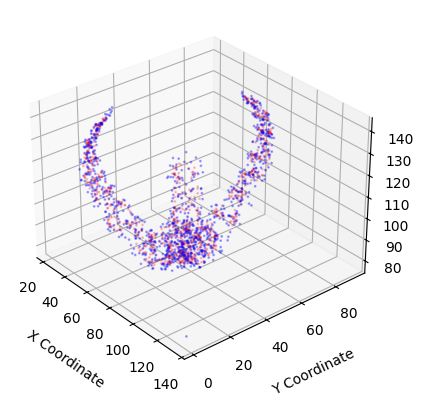

In [72]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Create the 3D scatter plot
ax.scatter(gt_data[:, 0], gt_data[:, 1], gt_data[:, 2], color='blue', s = 1, alpha = 0.3)
ax.scatter(test_frame_3[:, 0], test_frame_3[:, 1], test_frame_3[:, 2], c='red', s = 1, alpha = 0.2)

ax.view_init(elev=30, azim=-40)

# Label axes
ax.set_xlabel('X Coordinate', labelpad = 10)
ax.set_ylabel('Y Coordinate', labelpad = 10)
ax.set_zlabel('Z Coordinate', labelpad = 50)


plt.savefig(os.path.join(output_dir, 'sequence_0_noise2_video_overlap.png'))

# Show the plot
plt.show()

### Video Test (No need to use)

In [1]:
# # video test dir: test_frames/movie.mp4
# # inter frames: dhb_inter/sequence_v01/sequence_v01_video
# from moviepy import VideoFileClip, clips_array

# video1 = VideoFileClip("test_frames/movie.mp4")
# video2 = VideoFileClip("dhb_inter/sequence_v01/sequence_v01_video.mp4")

# common_fps = min(video1.fps, video2.fps)

# final_clip = clips_array([[video1, video2]])

# final_clip.write_videofile("merged_video/sequence_v01_merged_sep.mp4", codec='libx264', fps=common_fps)

{'video_found': True, 'audio_found': False, 'metadata': {'major_brand': 'isom', 'minor_version': '512', 'compatible_brands': 'isomiso2avc1mp41', 'encoder': 'Lavf61.1.100'}, 'inputs': [{'streams': [{'input_number': 0, 'stream_number': 0, 'stream_type': 'video', 'language': None, 'default': True, 'size': [704, 912], 'bitrate': 842, 'fps': 30.0, 'codec_name': 'h264', 'profile': '(High)', 'metadata': {'Metadata': '', 'handler_name': 'VideoHandler', 'vendor_id': '[0][0][0][0]', 'encoder': 'Lavc61.3.100 libx264'}}], 'input_number': 0}], 'duration': 33.33, 'bitrate': 845, 'start': 0.0, 'default_video_input_number': 0, 'default_video_stream_number': 0, 'video_codec_name': 'h264', 'video_profile': '(High)', 'video_size': [704, 912], 'video_bitrate': 842, 'video_fps': 30.0, 'video_duration': 33.33, 'video_n_frames': 999}
/home/winpaw1n/anaconda3/envs/npci/lib/python3.9/site-packages/imageio_ffmpeg/binaries/ffmpeg-linux-x86_64-v7.0.2 -i test_frames/movie.mp4 -loglevel error -f image2pipe -vf scal

MoviePy - Done !
MoviePy - video ready merged_video/sequence_v01_merged_sep.mp4


In [6]:
# from moviepy import VideoFileClip, CompositeVideoClip, clips_array
# import numpy as np

# def create_semi_transparent_clip(clip, opacity=0.6):
#     """
#     Creates a semi-transparent version of a clip by modifying its frames
    
#     Parameters:
#     clip: The VideoFileClip to make semi-transparent
#     opacity: Float between 0 and 1, where 1 is fully opaque
    
#     Returns:
#     A new clip with the specified opacity
#     """
#     def modify_frame(frame):
#         # Create a semi-transparent frame by adjusting alpha
#         # This works even with older MoviePy versions
#         return np.concatenate(
#             [frame, np.full((frame.shape[0], frame.shape[1], 1), 
#                            int(255 * opacity), dtype='uint8')],
#             axis=2
#         )
    
#     # Return a new clip with modified frames
#     return clip.fl_image(modify_frame)

# # Load the videos
# video1 = VideoFileClip("test_frames/movie.mp4")
# video2 = VideoFileClip("dhb_inter/sequence_v01/sequence_v01_video.mp4")

# # Calculate common frame rate
# common_fps = min(video1.fps, video2.fps)

# # Create a semi-transparent version of video2
# transparent_video2 = create_semi_transparent_clip(video2, opacity=0.6)

# # Method 1: Using clips_array (side by side)
# # side_by_side = clips_array([[video1, transparent_video2]])
# # side_by_side.write_videofile("side_by_side_output.mp4", fps=common_fps)

# # Method 2: Using CompositeVideoClip (overlay)
# # Resize video2 if needed for overlay
# resized_video2 = transparent_video2.resize(width=video1.w//2)
# # Position in top-right corner
# resized_video2 = resized_video2.set_position(("right", "top"))
# overlay = CompositeVideoClip([video1, resized_video2])
# overlay.write_videofile("merged_video/overlay_output.mp4", fps=common_fps)

In [12]:
from moviepy import VideoFileClip, CompositeVideoClip, clips_array

video1 = VideoFileClip("test_frames/movie.mp4")
video2 = VideoFileClip("dhb_inter/sequence_v01/sequence_v01_video.mp4")

# Calculate common duration
min_duration = min(video1.duration, video2.duration)

def make_transparent(get_frame_func, opacity=0.5):
    """Returns a function that gets frames with reduced opacity"""
    def get_transparent_frame(t):
        # Get the original frame and make it semi-transparent
        frame = get_frame_func(t)
        return (frame * opacity).astype('uint8')
    return get_transparent_frame

# Save original get_frame method
original_get_frame = video2.get_frame

# Replace with transparent version
video2.get_frame = make_transparent(video2.get_frame, opacity=0.7)

# Create composite with transparent video2 on top
final_clip = CompositeVideoClip([video1, video2])

final_clip.write_videofile("merged_video/sequence_v01_merged.mp4")

{'video_found': True, 'audio_found': False, 'metadata': {'major_brand': 'isom', 'minor_version': '512', 'compatible_brands': 'isomiso2avc1mp41', 'encoder': 'Lavf61.1.100'}, 'inputs': [{'streams': [{'input_number': 0, 'stream_number': 0, 'stream_type': 'video', 'language': None, 'default': True, 'size': [704, 912], 'bitrate': 983, 'fps': 30.0, 'codec_name': 'h264', 'profile': '(High)', 'metadata': {'Metadata': '', 'handler_name': 'VideoHandler', 'vendor_id': '[0][0][0][0]', 'encoder': 'Lavc61.3.100 libx264'}}], 'input_number': 0}], 'duration': 33.33, 'bitrate': 986, 'start': 0.0, 'default_video_input_number': 0, 'default_video_stream_number': 0, 'video_codec_name': 'h264', 'video_profile': '(High)', 'video_size': [704, 912], 'video_bitrate': 983, 'video_fps': 30.0, 'video_duration': 33.33, 'video_n_frames': 999}
/home/winpaw1n/anaconda3/envs/npci/lib/python3.9/site-packages/imageio_ffmpeg/binaries/ffmpeg-linux-x86_64-v7.0.2 -i test_frames/movie.mp4 -loglevel error -f image2pipe -vf scal

MoviePy - Done !
MoviePy - video ready merged_video/sequence_v01_merged.mp4
